In [ ]:
import pandas as pd
import numpy as np
from chembl_webresource_client.new_client import new_client
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs

def get_data(target_id):
    activities = new_client.activity
    res = activities.filter(target_chembl_id=target_id).filter(standard_type="IC50").filter(pchembl_value__isnull=False)
    df = pd.DataFrame.from_dict(res)
    return df[['canonical_smiles', 'pchembl_value']].rename(columns={'pchembl_value': f'pchembl_{target_id}'})

# JAK1: CHEMBL2835 | JAK2: CHEMBL2971
df_jak1 = get_data("CHEMBL2835")
df_jak2 = get_data("CHEMBL2971")

# Merge on SMILES to get molecules tested on BOTH
df = pd.merge(df_jak1, df_jak2, on='canonical_smiles').dropna()
df[df.columns[1:]] = df[df.columns[1:]].astype(float)

# Calculate the difference (Selectivity)
# Positive value means more potent for JAK1 (Desired)
df['pchembl_diff'] = df['pchembl_CHEMBL2835'] - df['pchembl_CHEMBL2971']

KeyboardInterrupt: 

In [31]:
from chembl_webresource_client.new_client import new_client
import pandas as pd

def get_data_fast(target_id):
    print(f"Fetching data for {target_id}...")
    activities = new_client.activity
    # .only() is the secret sauce here to speed up the transfer
    res = activities.filter(
        target_chembl_id=target_id, 
        standard_type="IC50", 
        pchembl_value__isnull=False
    ).only(['canonical_smiles', 'pchembl_value'])
    
    df = pd.DataFrame.from_dict(res)
    return df.rename(columns={'pchembl_value': f'pchembl_{target_id}'})

# JAK1 vs JAK2 (Change these IDs if you want different targets)
df_jak1 = get_data_fast("CHEMBL2835")
df_jak2 = get_data_fast("CHEMBL2971")

# Merge and calculate difference
df = pd.merge(df_jak1, df_jak2, on='canonical_smiles').dropna()
df[df.columns[1:]] = df[df.columns[1:]].astype(float)
df['pchembl_diff'] = df['pchembl_CHEMBL2835'] - df['pchembl_CHEMBL2971']

print(f"Dataset ready: {len(df)} common molecules found.")

Fetching data for CHEMBL2835...
Fetching data for CHEMBL2971...
Dataset ready: 29178 common molecules found.


In [32]:
def smiles_to_fp(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol:
        # 2048-bit Morgan Fingerprint (Radius 2 ~ ECFP4)
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048)
        arr = np.zeros((1,))
        DataStructs.ConvertToNumpyArray(fp, arr)
        return arr
    return None

df['fp'] = df['canonical_smiles'].apply(smiles_to_fp)
X = np.stack(df['fp'].values)

y1 = df['pchembl_CHEMBL2835'].values  # Target A
y2 = df['pchembl_CHEMBL2971'].values  # Target B
y_diff = df['pchembl_diff'].values    # Difference

[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerator
[21:16:01] DEPRECATION WARNING: please use MorganGenerat

In [33]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# We'll use the same indices for comparison consistency
def train_rf(X, y):
    model = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42)
    model.fit(X, y)
    return model

model1 = train_rf(X, y1)      # Logic: "What makes it a good JAK1 inhibitor?"
model2 = train_rf(X, y2)      # Logic: "What makes it a good JAK2 inhibitor?"
model_diff = train_rf(X, y_diff) # Logic: "What makes it SELECTIVE for JAK1?"

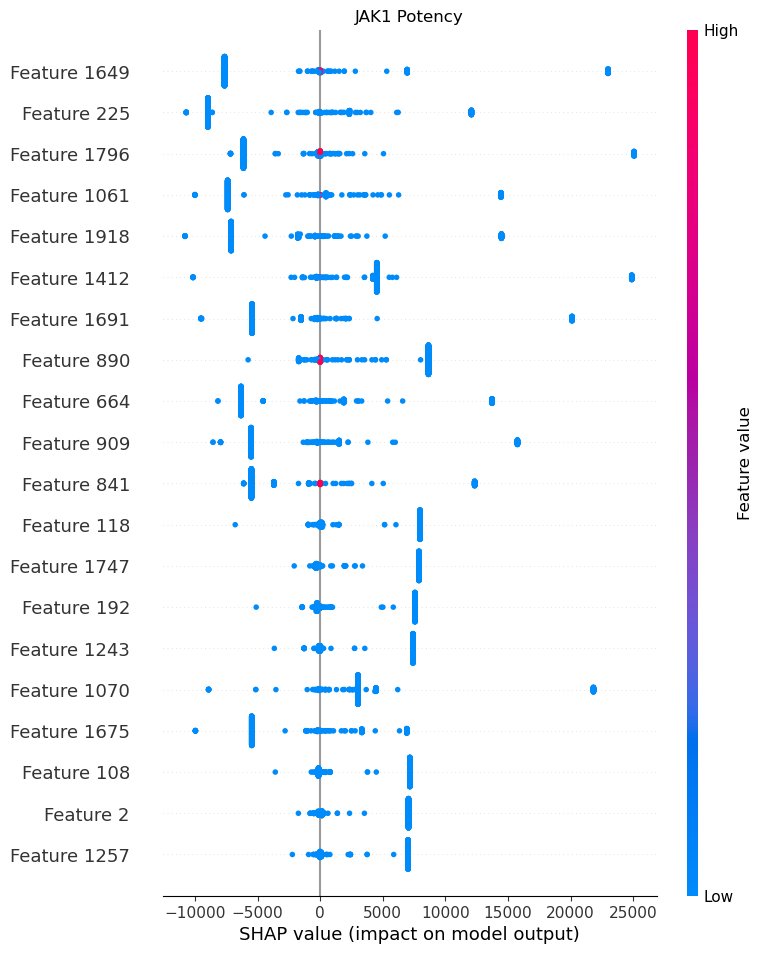

In [56]:
shap.summary_plot(shap_v1, X[:500], show=False); plt.title("JAK1 Potency")
plt.show()

Text(0.5, 1.0, 'JAK2 Potency')

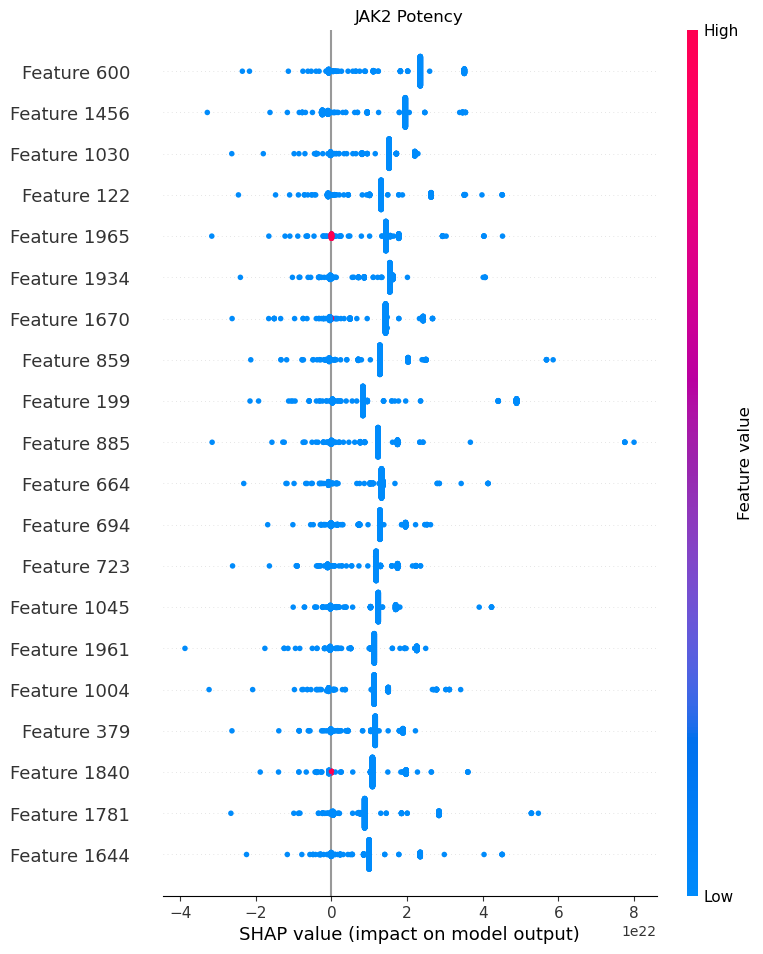

In [58]:
shap.summary_plot(shap_v2, X[:500], show=False); plt.title("JAK2 Potency")

Text(0.5, 1.0, 'Selectivity (JAK1-JAK2)')

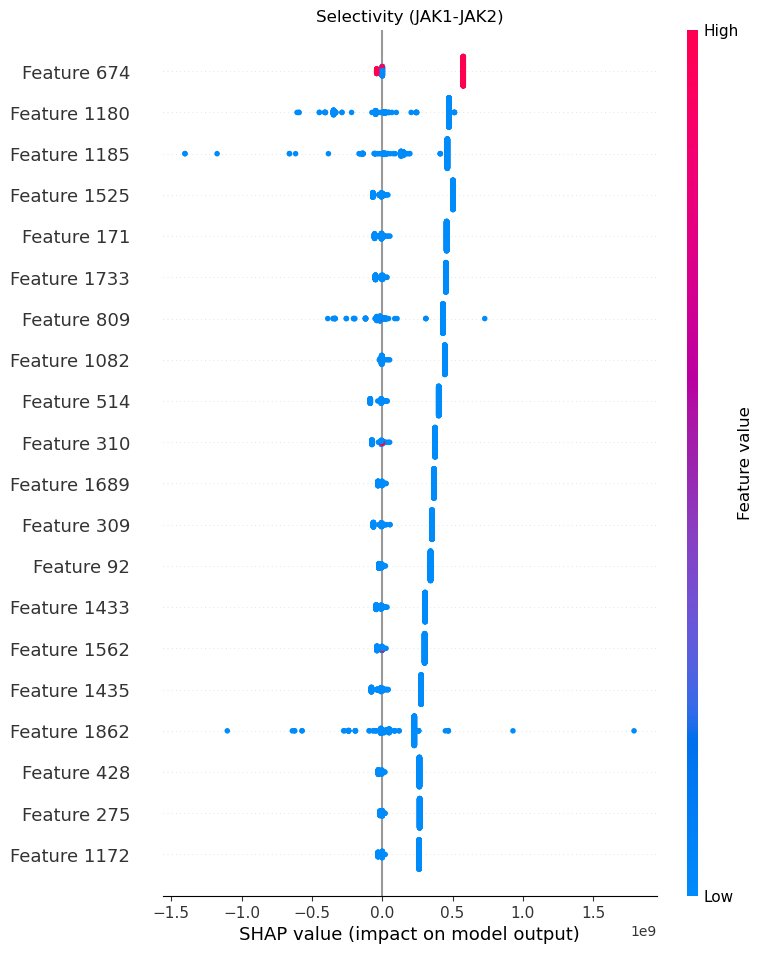

In [59]:
shap.summary_plot(shap_diff, X[:500], show=False); plt.title("Selectivity (JAK1-JAK2)")

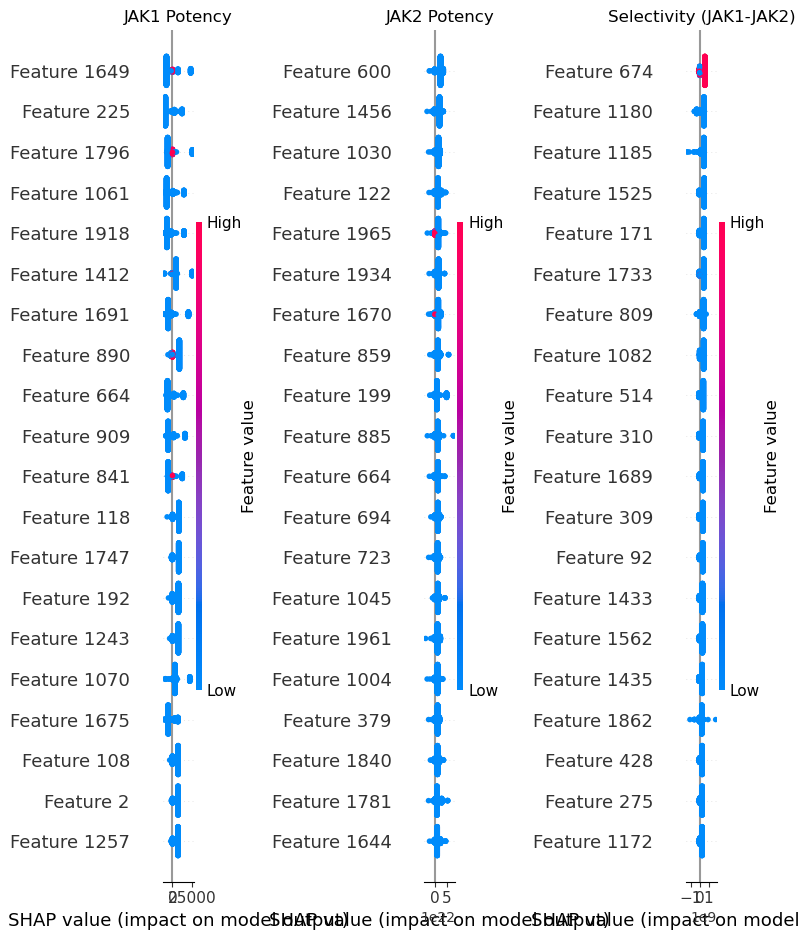

In [57]:
import shap
import matplotlib.pyplot as plt

# Initialize Explainers
explainer1 = shap.TreeExplainer(model1)
explainer2 = shap.TreeExplainer(model2)
explainer_diff = shap.TreeExplainer(model_diff)

# Calculate SHAP values for a subset (for speed) or the whole set
# Add check_additivity=False
shap_v1 = explainer1.shap_values(X[:500], check_additivity=False)
shap_v2 = explainer2.shap_values(X[:500], check_additivity=False)
shap_diff = explainer_diff.shap_values(X[:500], check_additivity=False)

# Plotting
plt.figure(figsize=(50,50))
plt.subplot(1,3,1); shap.summary_plot(shap_v1, X[:500], show=False); plt.title("JAK1 Potency")
plt.subplot(1,3,2); shap.summary_plot(shap_v2, X[:500], show=False); plt.title("JAK2 Potency")
plt.subplot(1,3,3); shap.summary_plot(shap_diff, X[:500], show=False); plt.title("Selectivity (JAK1-JAK2)")
plt.tight_layout()
plt.show()

[21:46:39] DEPRECATION WARNING: please use MorganGenerator


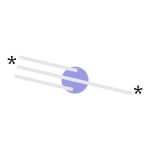

In [36]:
from rdkit.Chem import Draw

# Choose the top feature from your Selectivity plot (e.g., 674)
feature_id = 674 

# Find a molecule in your dataset that actually has this bit turned on
sample_mol_idx = df[df['fp'].apply(lambda x: x[feature_id] == 1)].index[0]
sample_smiles = df.loc[sample_mol_idx, 'canonical_smiles']
mol = Chem.MolFromSmiles(sample_smiles)

# Bit information retrieval
info = {}
fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=2048, bitInfo=info)

# Draw the fragment
# 'info' contains the atom index and radius for each bit
if feature_id in info:
    aid, rad = info[feature_id][0]
    img = Draw.DrawMorganBit(mol, feature_id, info)
    display(img)
else:
    print(f"Bit {feature_id} not found in this specific molecule.")

In [ ]:
from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG


weights = SimilarityMaps.GetAtomicWeightsForModel(test_mol, mol_to_fp, predict_func)

d2d = rdMolDraw2D.MolDraw2DSVG(400, 400)

SimilarityMaps.GetSimilarityMapFromWeights(
    test_mol, 
    weights, 
    d2d,             
    colorMap=plt.cm.RdBu, 
    contourLines=10,
    alpha=0.3
)

# 4. Finalize and Display
d2d.FinishDrawing()
SVG(d2d.GetDrawingText())

[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerator
[21:54:59] DEPRECATION WARNING: please use MorganGenerat

In [49]:
from sklearn.metrics import r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_model(y_true, y_pred, name):
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    print(f"--- {name} ---")
    print(f"R^2 Score: {r2:.3f}")
    print(f"MAE:       {mae:.3f}\n")
    return r2, mae

# 1. Get predictions (OOB or on a test set)
# If you didn't do a train/test split, we'll use the training set just for a quick 'sanity' check
# (In a real study, use a hold-out set!)
pred1 = model1.predict(X)
pred2 = model2.predict(X)
pred_diff = model_diff.predict(X)

# 2. Run Evaluations
evaluate_model(y1, pred1, "JAK1 Potency")
evaluate_model(y2, pred2, "JAK2 Potency")
evaluate_model(y_diff, pred_diff, "Selectivity (JAK1-JAK2)")

--- JAK1 Potency ---
R^2 Score: 0.801
MAE:       0.342

--- JAK2 Potency ---
R^2 Score: 0.652
MAE:       0.436

--- Selectivity (JAK1-JAK2) ---
R^2 Score: 0.469
MAE:       0.507



(0.4691419185044666, 0.5069327618032137)

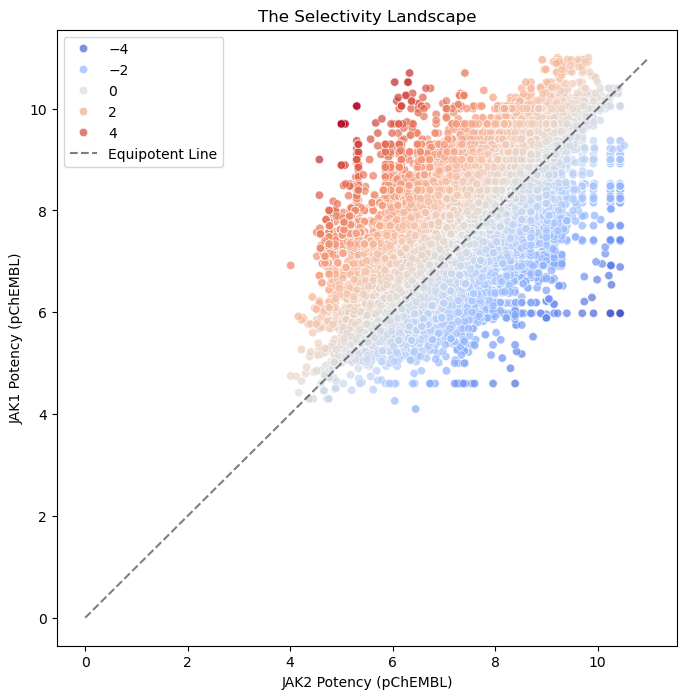

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 8))

# Scatter plot of Target A vs Target B
sns.scatterplot(x=y2, y=y1, hue=y_diff, palette="coolwarm", alpha=0.7)

# The 'Identity' line: Molecules on this line have ZERO selectivity
limit = max(max(y1), max(y2))
plt.plot([0, limit], [0, limit], 'k--', alpha=0.5, label="Equipotent Line")

plt.xlabel("JAK2 Potency (pChEMBL)")
plt.ylabel("JAK1 Potency (pChEMBL)")
plt.title("The Selectivity Landscape")
plt.legend()
plt.show()

In [53]:
# Check if the presence of Nitrile correlates with the model's 'High Selectivity' prediction
df['has_nitrile'] = df['canonical_smiles'].str.contains('N#C')
print(f"Mean Selectivity with Nitrile: {df[df['has_nitrile']]['pchembl_diff'].mean():.2f}")
print(f"Mean Selectivity without:      {df[~df['has_nitrile']]['pchembl_diff'].mean():.2f}")

Mean Selectivity with Nitrile: 0.42
Mean Selectivity without:      0.37


[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerat

--- JAK1 Selective (The Target) ---
SMILES: N#CC[C@H](C1CCCC1)n1cc(-c2ncnc3[nH]ccc23)cn1


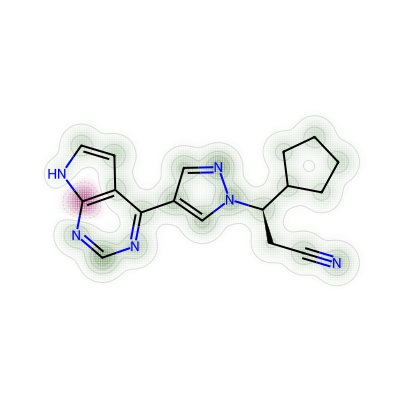

[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerator
[22:53:17] DEPRECATION WARNING: please use MorganGenerat

--- Equipotent (The Promiscuous) ---
SMILES: N#CCC1(n2cc(-c3ncnc4[nH]ccc34)cn2)CN(C2CCN(C(=O)C3(c4ccccc4)CC3)CC2)C1


[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerator
[22:53:18] DEPRECATION WARNING: please use MorganGenerat

--- JAK2 Selective (The Inverse) ---
SMILES: N#CC[C@H](C1CCCC1)n1cc(-c2ncnc3[nH]ccc23)cn1


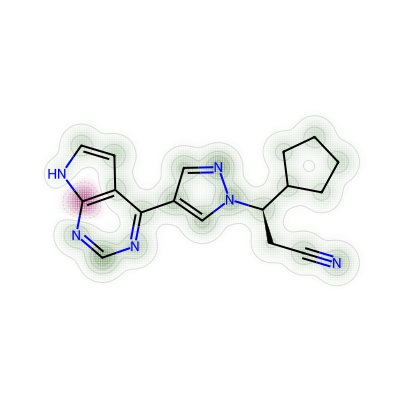

In [54]:
# 1. Identify the 'Best' and 'Worst' for selectivity
top_jak1_selective = df.nlargest(1, 'pchembl_diff')
top_jak2_selective = df.nsmallest(1, 'pchembl_diff') # Most negative diff
equipotent = df.iloc[(df['pchembl_diff'].abs()).argsort()[:1]] # Closest to 0

comparison_mols = [
    (top_jak1_selective, "JAK1 Selective (The Target)"),
    (equipotent, "Equipotent (The Promiscuous)"),
    (top_jak2_selective, "JAK2 Selective (The Inverse)")
]

# 2. Loop and Draw
for row_df, title in comparison_mols:
    smiles = row_df.iloc[0]['canonical_smiles']
    mol = Chem.MolFromSmiles(smiles)
    
    # Calculate weights
    weights = SimilarityMaps.GetAtomicWeightsForModel(mol, mol_to_fp, predict_func)
    
    # Draw (Using the SVG method that worked)
    d2d = rdMolDraw2D.MolDraw2DSVG(400, 400)
    SimilarityMaps.GetSimilarityMapFromWeights(mol, weights, d2d, contourLines=10)
    d2d.FinishDrawing()
    
    print(f"--- {title} ---")
    print(f"SMILES: {smiles}")
    display(SVG(d2d.GetDrawingText()))

In [55]:
# 1. Define a totally new, 'unseen' molecule (Upadacitinib - highly JAK1 selective)
unseen_smiles = "CC[C@@H]1CN(C(=O)NC2=CC=C(C=C2)C3=C4C=CNC4=NC=N3)C[C@@H]1C5=CC=C(C=C5)F" 
# Note: You can also just pull a row from a 'test_df' if you created one.

unseen_mol = Chem.MolFromSmiles(unseen_smiles)

# 2. Run the Selectivity Map
weights = SimilarityMaps.GetAtomicWeightsForModel(unseen_mol, mol_to_fp, predict_func)

# 3. Draw and Compare
d2d = rdMolDraw2D.MolDraw2DSVG(400, 400)
SimilarityMaps.GetSimilarityMapFromWeights(unseen_mol, weights, d2d, contourLines=10)
d2d.FinishDrawing()

print(f"Blind Prediction for Unseen Molecule: {predict_func(mol_to_fp(unseen_mol)):.2f}")
display(SVG(d2d.GetDrawingText()))

[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerator
[22:55:44] DEPRECATION WARNING: please use MorganGenerat

Blind Prediction for Unseen Molecule: 0.44


[22:55:45] DEPRECATION WARNING: please use MorganGenerator
